In [1]:
using ApproxFun
using LinearAlgebra
using Plots

In [2]:
dx=(0..1)

0..1

In [3]:
dt=(0..1)

0..1

In [4]:
domain=dx×dt

0..1 x 0..1

In [5]:
∂x=Derivative(domain,[1,0])

DerivativeWrapper : Chebyshev(0..1)⊗Chebyshev(0..1) → Ultraspherical(1,0..1)⊗Chebyshev(0..1)
 0.0  0.0  2.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  ⋯
 0.0  0.0  0.0  0.0  2.0  0.0  0.0  0.0  0.0  0.0  ⋱
 0.0  0.0  0.0  0.0  0.0  4.0  0.0  0.0  0.0  0.0  ⋱
 0.0  0.0  0.0  0.0  0.0  0.0  0.0  2.0  0.0  0.0  ⋱
 0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  4.0  0.0  ⋱
 0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  6.0  ⋱
 0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  ⋱
 0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  ⋱
 0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  ⋱
 0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  ⋱
  ⋮    ⋱    ⋱    ⋱    ⋱    ⋱    ⋱    ⋱    ⋱    ⋱   ⋱

In [6]:
∂t=Derivative(domain,[0,1])

DerivativeWrapper : Chebyshev(0..1)⊗Chebyshev(0..1) → Chebyshev(0..1)⊗Ultraspherical(1,0..1)
 0.0  2.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  ⋯
 0.0  0.0  0.0  4.0  0.0  0.0  0.0  0.0  0.0  0.0  ⋱
 0.0  0.0  0.0  0.0  2.0  0.0  0.0  0.0  0.0  0.0  ⋱
 0.0  0.0  0.0  0.0  0.0  0.0  6.0  0.0  0.0  0.0  ⋱
 0.0  0.0  0.0  0.0  0.0  0.0  0.0  4.0  0.0  0.0  ⋱
 0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  2.0  0.0  ⋱
 0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  ⋱
 0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  ⋱
 0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  ⋱
 0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  ⋱
  ⋮    ⋱    ⋱    ⋱    ⋱    ⋱    ⋱    ⋱    ⋱    ⋱   ⋱

In [7]:
#D=[∂t^2-∂x^2 0 0 0;
#   ∂t ∂x 0 0;
#   0 0 ∂t^2-∂x^2 0;
#   0 0 0 ∂t^2-∂x^2]

D=[∂t^2-∂x^2 0;
   ∂t ∂x]

InterlaceOperator : 2-element ArraySpace:
TensorSpace{Tuple{Chebyshev{Interval{:closed,:closed,Int64},Float64},Chebyshev{Interval{:closed,:closed,Int64},Float64}},DomainSets.ProductDomain{Tuple{Interval{:closed,:closed,Int64},Interval{:closed,:closed,Int64}},Tuple{Int64,Int64},StaticArrays.SArray{Tuple{2},Int64,1,2}},Float64}[Chebyshev(0..1)⊗Chebyshev(0..1), Chebyshev(0..1)⊗Chebyshev(0..1)] → 2-element ArraySpace:
TensorSpace{Tuple{Ultraspherical{Int64,Interval{:closed,:closed,Int64},Float64},Ultraspherical{Int64,Interval{:closed,:closed,Int64},Float64}},DomainSets.ProductDomain{Tuple{Interval{:closed,:closed,Int64},Interval{:closed,:closed,Int64}},Tuple{Int64,Int64},StaticArrays.SArray{Tuple{2},Int64,1,2}},Float64}[Ultraspherical(2,0..1)⊗Ultraspherical(2,0..1), Ultraspherical(1,0..1)⊗Ultraspherical(1,0..1)]
 0.0  0.0  0.0  0.0  0.0  0.0  16.0  0.0  -16.0  0.0  ⋯
 0.0  0.0  2.0  0.0  0.0  2.0   0.0  0.0    0.0  0.0  ⋱
 0.0  0.0  0.0  0.0  0.0  0.0   0.0  0.0    0.0  0.0  ⋱
 0.0  0.0  0

In [8]:
Bdy_V=[I⊗ldirichlet(dt);lneumann(dx)⊗I;rneumann(dx)⊗I]

InterlaceOperator : Chebyshev(0..1)⊗Chebyshev(0..1) → 3-element ArraySpace:
TensorSpace{SV,D,Float64} where D where SV[Chebyshev(0..1)⊗ConstantSpace(Point(0)), ConstantSpace(Point(0))⊗Chebyshev(0..1), ConstantSpace(Point(1))⊗Chebyshev(0..1)]
 1.0  -1.0  0.0  1.0   0.0   0.0  -1.0  0.0   0.0   0.0  ⋯
 0.0   0.0  2.0  0.0   0.0  -8.0   0.0  0.0   0.0  18.0  ⋱
 0.0   0.0  2.0  0.0   0.0   8.0   0.0  0.0   0.0  18.0  ⋱
 0.0   0.0  1.0  0.0  -1.0   0.0   0.0  1.0   0.0   0.0  ⋱
 0.0   0.0  0.0  0.0   2.0   0.0   0.0  0.0  -8.0   0.0  ⋱
 0.0   0.0  0.0  0.0   2.0   0.0   0.0  0.0   8.0   0.0  ⋱
 0.0   0.0  0.0  0.0   0.0   1.0   0.0  0.0  -1.0   0.0  ⋱
 0.0   0.0  0.0  0.0   0.0   0.0   0.0  2.0   0.0   0.0  ⋱
 0.0   0.0  0.0  0.0   0.0   0.0   0.0  2.0   0.0   0.0  ⋱
 0.0   0.0  0.0  0.0   0.0   0.0   0.0  0.0   0.0   1.0  ⋱
  ⋮     ⋱    ⋱    ⋱     ⋱     ⋱     ⋱    ⋱     ⋱     ⋱   ⋱

In [9]:
Bdy_A=[I⊗ldirichlet(dt);ldirichlet(dx)⊗I]

InterlaceOperator : Chebyshev(0..1)⊗Chebyshev(0..1) → 2-element ArraySpace:
TensorSpace{SV,D,Float64} where D where SV[Chebyshev(0..1)⊗ConstantSpace(Point(0)), ConstantSpace(Point(0))⊗Chebyshev(0..1)]
 1.0  -1.0   0.0  1.0   0.0  0.0  -1.0   0.0   0.0   0.0  ⋯
 1.0   0.0  -1.0  0.0   0.0  1.0   0.0   0.0   0.0  -1.0  ⋱
 0.0   0.0   1.0  0.0  -1.0  0.0   0.0   1.0   0.0   0.0  ⋱
 0.0   1.0   0.0  0.0  -1.0  0.0   0.0   0.0   1.0   0.0  ⋱
 0.0   0.0   0.0  0.0   0.0  1.0   0.0   0.0  -1.0   0.0  ⋱
 0.0   0.0   0.0  1.0   0.0  0.0   0.0  -1.0   0.0   0.0  ⋱
 0.0   0.0   0.0  0.0   0.0  0.0   0.0   0.0   0.0   1.0  ⋱
 0.0   0.0   0.0  0.0   0.0  0.0   1.0   0.0   0.0   0.0  ⋱
 0.0   0.0   0.0  0.0   0.0  0.0   0.0   0.0   0.0   0.0  ⋱
 0.0   0.0   0.0  0.0   0.0  0.0   0.0   0.0   0.0   0.0  ⋱
  ⋮     ⋱     ⋱    ⋱     ⋱    ⋱     ⋱     ⋱     ⋱     ⋱   ⋱

In [10]:
Bdy_op=[Bdy_V 0; 
        0 Bdy_A]      

InterlaceOperator : 2-element ArraySpace:
TensorSpace{Tuple{Chebyshev{Interval{:closed,:closed,Int64},Float64},Chebyshev{Interval{:closed,:closed,Int64},Float64}},DomainSets.ProductDomain{Tuple{Interval{:closed,:closed,Int64},Interval{:closed,:closed,Int64}},Tuple{Int64,Int64},StaticArrays.SArray{Tuple{2},Int64,1,2}},Float64}[Chebyshev(0..1)⊗Chebyshev(0..1), Chebyshev(0..1)⊗Chebyshev(0..1)] → 2-element ArraySpace:
ApproxFunBase.ArraySpace{TensorSpace{SV,D,Float64} where D where SV,1,DomainSets.ProductDomain{Tuple{Interval{:closed,:closed,Int64},DomainSets.Point{Int64}},Tuple{Int64,Int64},StaticArrays.SArray{Tuple{2},Int64,1,2}},Float64}[3-element ArraySpace:
TensorSpace{SV,D,Float64} where D where SV[Chebyshev(0..1)⊗ConstantSpace(Point(0)), ConstantSpace(Point(0))⊗Chebyshev(0..1), ConstantSpace(Point(1))⊗Chebyshev(0..1)], 2-element ArraySpace:
TensorSpace{SV,D,Float64} where D where SV[Chebyshev(0..1)⊗ConstantSpace(Point(0)), ConstantSpace(Point(0))⊗Chebyshev(0..1)]]
 1.0  0.0  -1.0  0

In [11]:
α=π^2

9.869604401089358

In [12]:
k=3 #Selects mode

3

In [13]:
ρ=Fun((a,b)->α*exp(-(a-b)^2/0.1^2), domain)

Fun(Chebyshev(0..1)⊗Chebyshev(0..1),[1.65689, 1.25884e-16, 1.99259e-16, 0.507454, 3.76906, 0.507454, -2.62257e-17, -3.77558e-16, -1.11288e-16, 5.61931e-17  …  -3.27092e-15, 5.43772e-15, -8.32093e-15, 1.16957e-14, -1.52153e-14, 1.83415e-14, -2.0518e-14, 2.12883e-14, -2.05029e-14, 1.8342e-14])

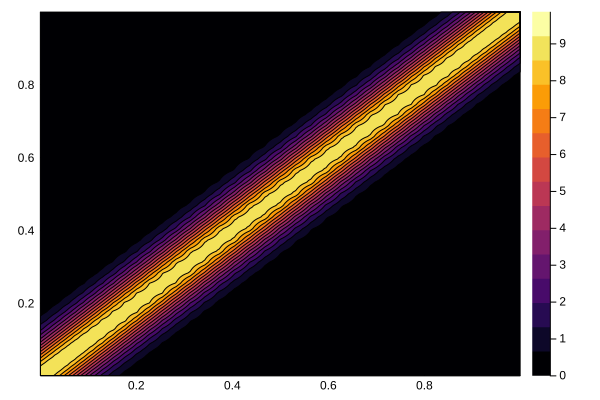

In [14]:
contourf(ρ)

In [15]:
V_0=Fun(a->cos(π*a),dx)

Fun(Chebyshev(0..1),[2.94903e-17, -1.13365, -2.31823e-17, 0.138072, -2.15142e-17, -0.00449071, 2.22479e-17, 6.77013e-5, -1.03938e-17, -5.8913e-7, -8.44511e-19, 3.33806e-9, -2.0229e-18, -1.32971e-11, 2.87454e-17, 3.92245e-14])

In [16]:
A_0=Fun(a->-sin(π*a),dx)

Fun(Chebyshev(0..1),[-0.472001, -4.84037e-18, 0.499403, 4.92946e-17, -0.0279921, 3.19766e-17, 0.000596695, 3.92401e-18, -6.70439e-6, 4.92641e-18, 4.65323e-8, 5.38826e-18, -2.19346e-10, -1.68548e-17, 7.48165e-13, 1.07171e-17, -1.88411e-15])

In [17]:
Bdy_ans_V=[V_0;0;0]

Fun(3-element ArraySpace:
Space[Chebyshev(0..1), ConstantSpace, ConstantSpace],[2.94903e-17, 0.0, 0.0, -1.13365, -2.31823e-17, 0.138072, -2.15142e-17, -0.00449071, 2.22479e-17, 6.77013e-5, -1.03938e-17, -5.8913e-7, -8.44511e-19, 3.33806e-9, -2.0229e-18, -1.32971e-11, 2.87454e-17, 3.92245e-14])

In [18]:
Bdy_ans_A=[A_0;0]

Fun(2-element ArraySpace:
Space[Chebyshev(0..1), ConstantSpace],[-0.472001, 0.0, -4.84037e-18, 0.499403, 4.92946e-17, -0.0279921, 3.19766e-17, 0.000596695, 3.92401e-18, -6.70439e-6, 4.92641e-18, 4.65323e-8, 5.38826e-18, -2.19346e-10, -1.68548e-17, 7.48165e-13, 1.07171e-17, -1.88411e-15])

In [19]:
@time Av0=\([D,Bdy_op],[[ρ,0],[Bdy_ans_V,Bdy_ans_A]],tolerance=1e-4)

 90.492087 seconds (58.75 M allocations: 6.152 GiB, 2.34% gc time)


Fun(2-element ArraySpace:
TensorSpace{Tuple{Chebyshev{Interval{:closed,:closed,Int64},Float64},Chebyshev{Interval{:closed,:closed,Int64},Float64}},DomainSets.ProductDomain{Tuple{Interval{:closed,:closed,Int64},Interval{:closed,:closed,Int64}},Tuple{Int64,Int64},StaticArrays.SArray{Tuple{2},Int64,1,2}},Float64}[Chebyshev(0..1)⊗Chebyshev(0..1), Chebyshev(0..1)⊗Chebyshev(0..1)],[0.291081, -0.152623, 0.387648, -0.677433, 0.25173, -0.387648, 0.107353, 1.19656, -0.0424734, -0.12259  …  -5.78032e-13, -6.21164e-13, -5.7059e-13, -4.60921e-13, -3.26463e-13, -1.95987e-13, -7.80889e-14, 1.11128e-14, 7.04971e-14, 3.97531e-13])

In [20]:
@time av0=\([D,Bdy_op],[[0,0],[Bdy_ans_V,Bdy_ans_A]],tolerance=1e-4)

  1.383865 seconds (3.57 M allocations: 181.038 MiB, 6.38% gc time)


Fun(2-element ArraySpace:
TensorSpace{Tuple{Chebyshev{Interval{:closed,:closed,Int64},Float64},Chebyshev{Interval{:closed,:closed,Int64},Float64}},DomainSets.ProductDomain{Tuple{Interval{:closed,:closed,Int64},Interval{:closed,:closed,Int64}},Tuple{Int64,Int64},StaticArrays.SArray{Tuple{2},Int64,1,2}},Float64}[Chebyshev(0..1)⊗Chebyshev(0..1), Chebyshev(0..1)⊗Chebyshev(0..1)],[-5.6051e-15, 0.222785, -5.20374e-15, -0.535083, 0.535083, 4.7868e-15, 5.97211e-17, 1.28516, 5.69725e-17, -0.235719  …  2.90588e-18, 2.19704e-20, 1.95836e-16, 9.58521e-20, 2.71637e-15, -1.77459e-19, 5.70857e-15, -1.07799e-16, 3.85064e-16, -7.69924e-16])

In [21]:
Aγ0=[Av0[1];Av0[2];0;0;0;0;0;0]

Fun(8-element ArraySpace:
Space[Chebyshev(0..1)⊗Chebyshev(0..1), Chebyshev(0..1)⊗Chebyshev(0..1), ConstantSpace, ConstantSpace, ConstantSpace, ConstantSpace, ConstantSpace, ConstantSpace],[0.291081, -0.152623, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.387648, -0.677433  …  -5.78032e-13, -6.21164e-13, -5.7059e-13, -4.60921e-13, -3.26463e-13, -1.95987e-13, -7.80889e-14, 1.11128e-14, 7.04971e-14, 3.97531e-13])

In [22]:
aγ0=[av0[1];av0[2];0;0;0;0;0;0]

Fun(8-element ArraySpace:
Space[Chebyshev(0..1)⊗Chebyshev(0..1), Chebyshev(0..1)⊗Chebyshev(0..1), ConstantSpace, ConstantSpace, ConstantSpace, ConstantSpace, ConstantSpace, ConstantSpace],[-5.6051e-15, 0.222785, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, -5.20374e-15, -0.535083  …  2.90588e-18, 2.19704e-20, 1.95836e-16, 9.58521e-20, 2.71637e-15, -1.77459e-19, 5.70857e-15, -1.07799e-16, 3.85064e-16, -7.69924e-16])

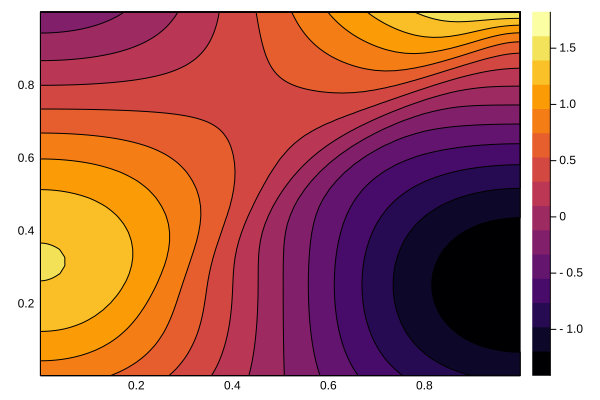

In [23]:
contourf(Aγ0[1])

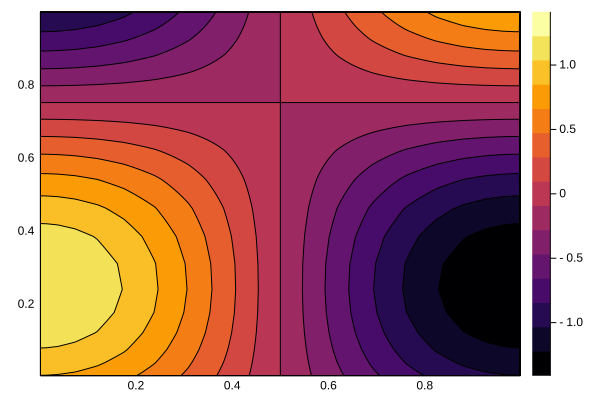

In [24]:
contourf(aγ0[1])

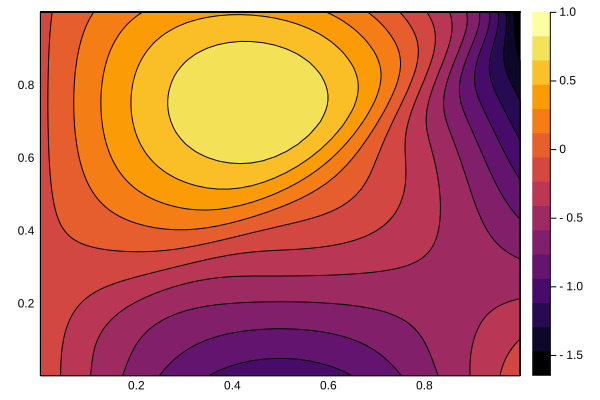

In [25]:
contourf(Aγ0[2])

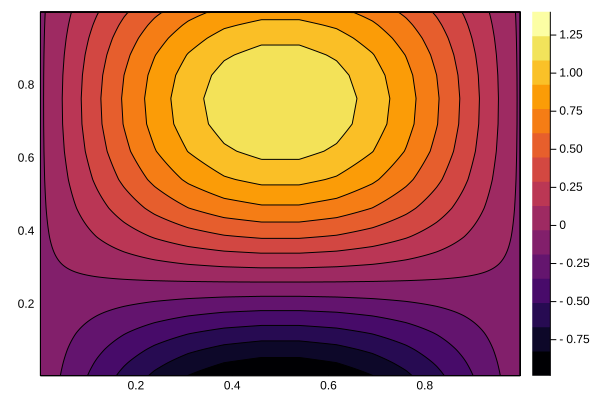

In [26]:
contourf(aγ0[2])

In [27]:
γ0A=[Av0[1];-Av0[2];0;0;0;0;0;0]

Fun(8-element ArraySpace:
Space[Chebyshev(0..1)⊗Chebyshev(0..1), Chebyshev(0..1)⊗Chebyshev(0..1), ConstantSpace, ConstantSpace, ConstantSpace, ConstantSpace, ConstantSpace, ConstantSpace],[0.291081, 0.152623, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.387648, -0.677433  …  5.78032e-13, 6.21164e-13, 5.7059e-13, 4.60921e-13, 3.26463e-13, 1.95987e-13, 7.80889e-14, -1.11128e-14, -7.04971e-14, -3.97531e-13])

In [28]:
γ0a=[av0[1];-av0[2];0;0;0;0;0;0]

Fun(8-element ArraySpace:
Space[Chebyshev(0..1)⊗Chebyshev(0..1), Chebyshev(0..1)⊗Chebyshev(0..1), ConstantSpace, ConstantSpace, ConstantSpace, ConstantSpace, ConstantSpace, ConstantSpace],[-5.6051e-15, -0.222785, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, -5.20374e-15, -0.535083  …  2.90588e-18, 2.19704e-20, 1.95836e-16, 9.58521e-20, 2.71637e-15, -1.77459e-19, 5.70857e-15, -1.07799e-16, 3.85064e-16, -7.69924e-16])

In [29]:
∇γ0=  [∂t  -∂x  0   0   0   0   0   0;
       -∂x  ∂t  0   0   0   0   0   0;
       0    0   ∂t  0   0   0   -∂x 0;
       0    0   0   ∂t  0   ∂x  0   0;
       0    0   0   0   ∂t  0   0   -∂x;
       0    0   0   ∂x  0   ∂t  0   0;
       0    0   -∂x 0   0   0   ∂t  0;
       0    0   0   0   -∂x 0   0   ∂t]

InterlaceOperator : 8-element ArraySpace:
TensorSpace{Tuple{Chebyshev{Interval{:closed,:closed,Int64},Float64},Chebyshev{Interval{:closed,:closed,Int64},Float64}},DomainSets.ProductDomain{Tuple{Interval{:closed,:closed,Int64},Interval{:closed,:closed,Int64}},Tuple{Int64,Int64},StaticArrays.SArray{Tuple{2},Int64,1,2}},Float64}[Chebyshev(0..1)⊗Chebyshev(0..1), Chebyshev(0..1)⊗Chebyshev(0..1), Chebyshev(0..1)⊗Chebyshev(0..1), Chebyshev(0..1)⊗Chebyshev(0..1), Chebyshev(0..1)⊗Chebyshev(0..1), Chebyshev(0..1)⊗Chebyshev(0..1), Chebyshev(0..1)⊗Chebyshev(0..1), Chebyshev(0..1)⊗Chebyshev(0..1)] → 8-element ArraySpace:
TensorSpace{Tuple{Ultraspherical{Int64,Interval{:closed,:closed,Int64},Float64},Ultraspherical{Int64,Interval{:closed,:closed,Int64},Float64}},DomainSets.ProductDomain{Tuple{Interval{:closed,:closed,Int64},Interval{:closed,:closed,Int64}},Tuple{Int64,Int64},StaticArrays.SArray{Tuple{2},Int64,1,2}},Float64}[Ultraspherical(1,0..1)⊗Ultraspherical(1,0..1), Ultraspherical(1,0..1)⊗Ultras

In [30]:
F=(∇γ0)*(γ0A)

Fun(8-element ArraySpace:
TensorSpace{Tuple{Ultraspherical{Int64,Interval{:closed,:closed,Int64},Float64},Ultraspherical{Int64,Interval{:closed,:closed,Int64},Float64}},DomainSets.ProductDomain{Tuple{Interval{:closed,:closed,Int64},Interval{:closed,:closed,Int64}},Tuple{Int64,Int64},StaticArrays.SArray{Tuple{2},Int64,1,2}},Float64}[Ultraspherical(1,0..1)⊗Ultraspherical(1,0..1), Ultraspherical(1,0..1)⊗Ultraspherical(1,0..1), Ultraspherical(1,0..1)⊗Ultraspherical(1,0..1), Ultraspherical(1,0..1)⊗Ultraspherical(1,0..1), Ultraspherical(1,0..1)⊗Ultraspherical(1,0..1), Ultraspherical(1,0..1)⊗Ultraspherical(1,0..1), Ultraspherical(1,0..1)⊗Ultraspherical(1,0..1), Ultraspherical(1,0..1)⊗Ultraspherical(1,0..1)],[-2.08167e-16, 0.851406, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, -1.0339e-15, 5.55112e-17  …  0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0])

In [31]:
f=(∇γ0)*(γ0a)

Fun(8-element ArraySpace:
TensorSpace{Tuple{Ultraspherical{Int64,Interval{:closed,:closed,Int64},Float64},Ultraspherical{Int64,Interval{:closed,:closed,Int64},Float64}},DomainSets.ProductDomain{Tuple{Interval{:closed,:closed,Int64},Interval{:closed,:closed,Int64}},Tuple{Int64,Int64},StaticArrays.SArray{Tuple{2},Int64,1,2}},Float64}[Ultraspherical(1,0..1)⊗Ultraspherical(1,0..1), Ultraspherical(1,0..1)⊗Ultraspherical(1,0..1), Ultraspherical(1,0..1)⊗Ultraspherical(1,0..1), Ultraspherical(1,0..1)⊗Ultraspherical(1,0..1), Ultraspherical(1,0..1)⊗Ultraspherical(1,0..1), Ultraspherical(1,0..1)⊗Ultraspherical(1,0..1), Ultraspherical(1,0..1)⊗Ultraspherical(1,0..1), Ultraspherical(1,0..1)⊗Ultraspherical(1,0..1)],[0.0, -1.68199e-13, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, -8.75706e-17, -5.55112e-17  …  0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0])

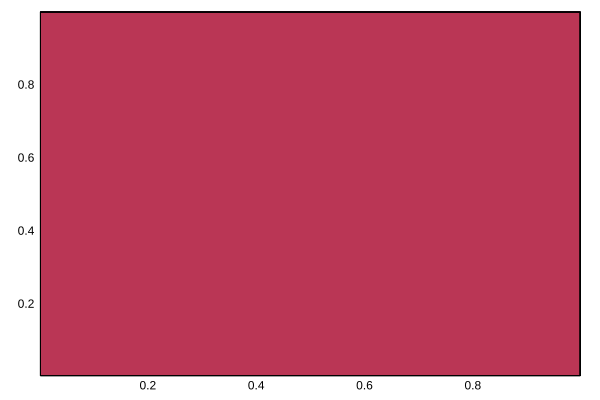

In [32]:
contourf(F[1])

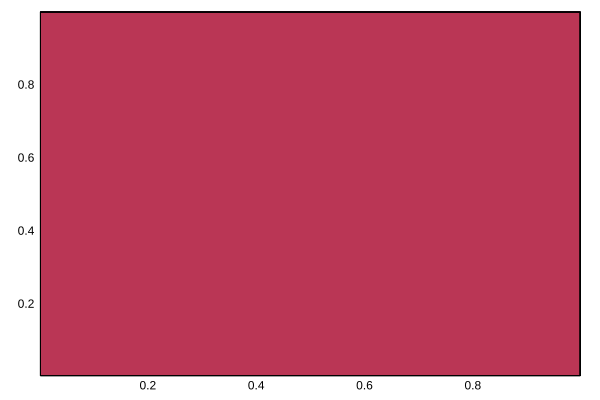

In [33]:
contourf(f[1])

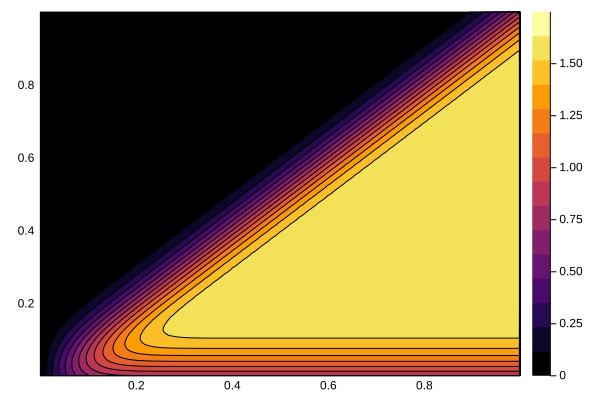

In [34]:
contourf(F[2])

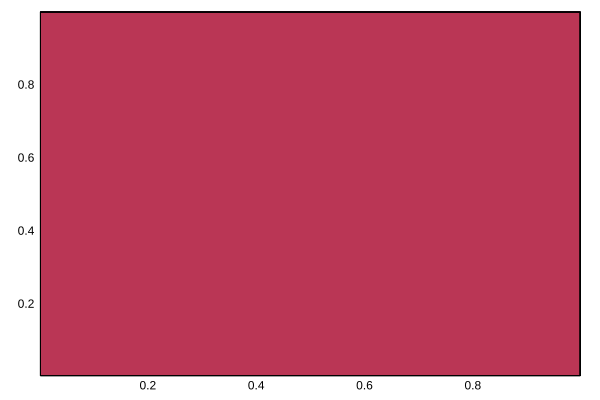

In [35]:
contourf(f[2])

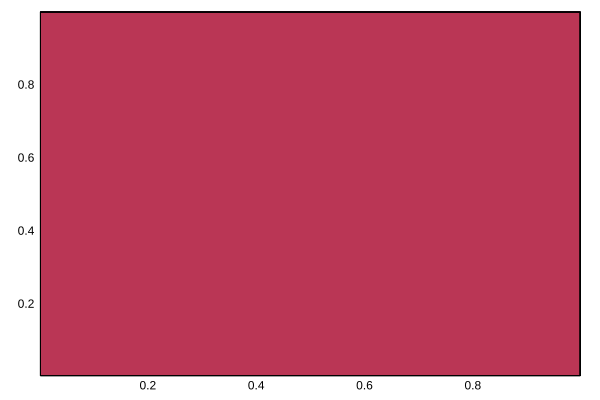

In [36]:
contourf(F[3])

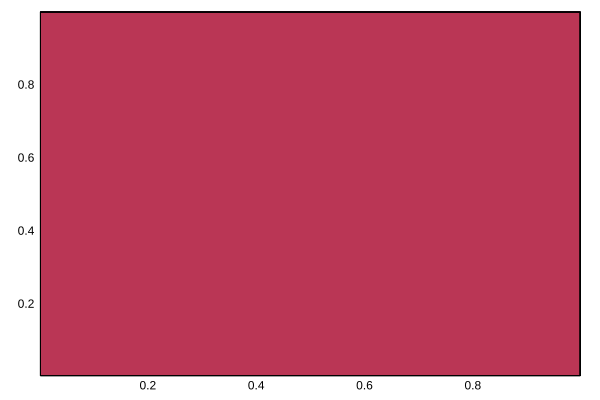

In [37]:
contourf(f[3])

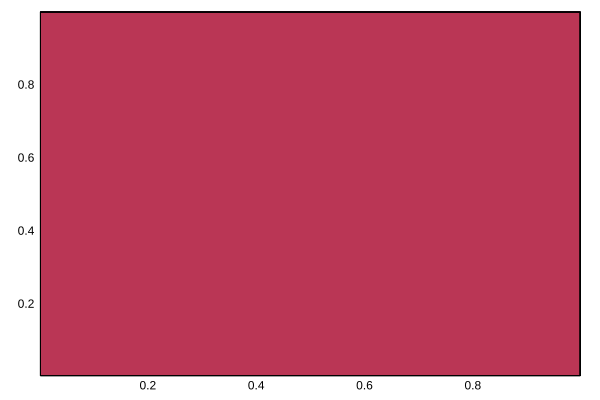

In [38]:
contourf(F[4])

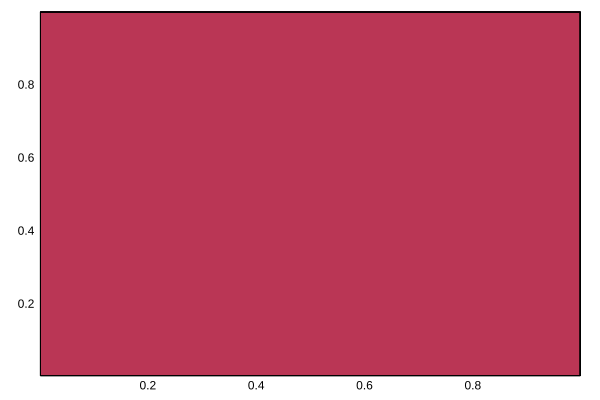

In [39]:
contourf(f[4])

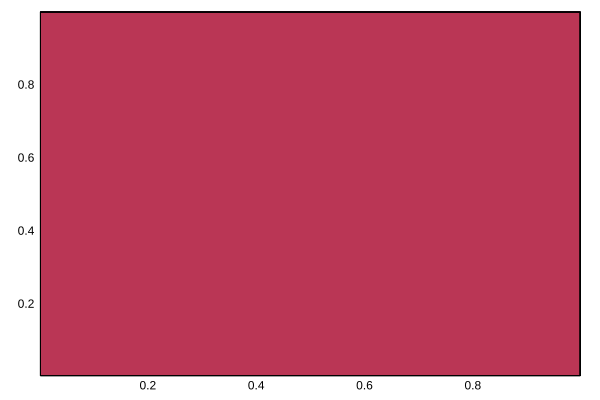

In [40]:
contourf(F[5])

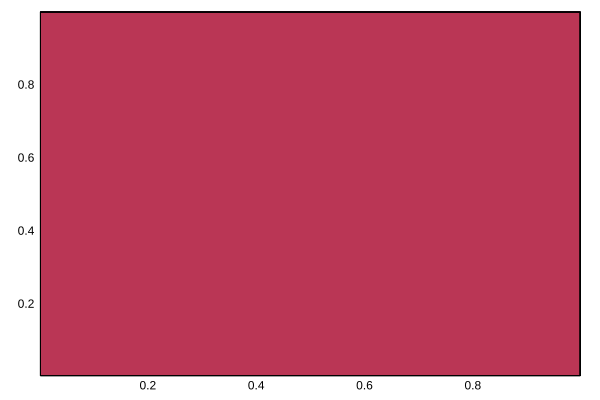

In [41]:
contourf(f[5])

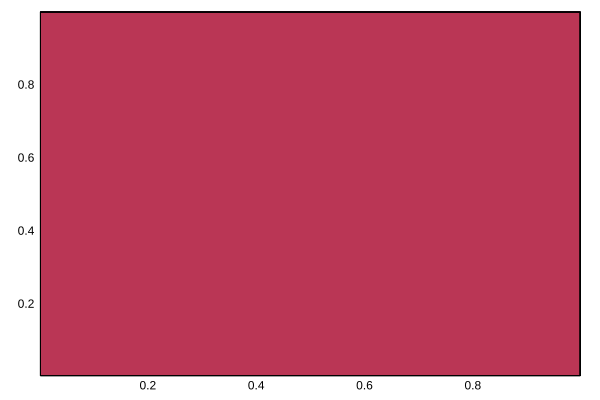

In [42]:
contourf(F[6])

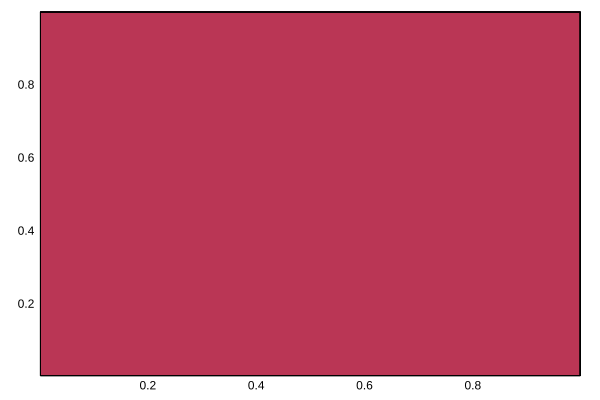

In [43]:
contourf(f[6])

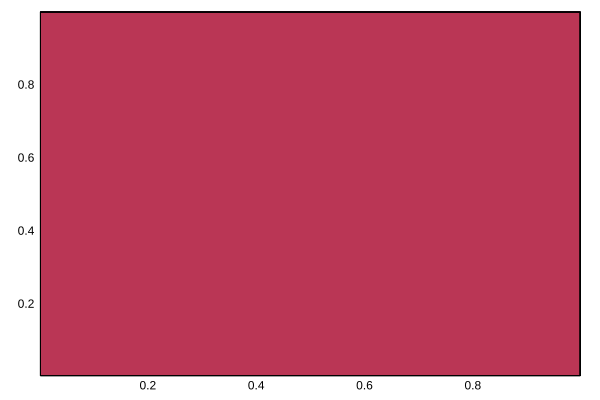

In [44]:
contourf(F[7])

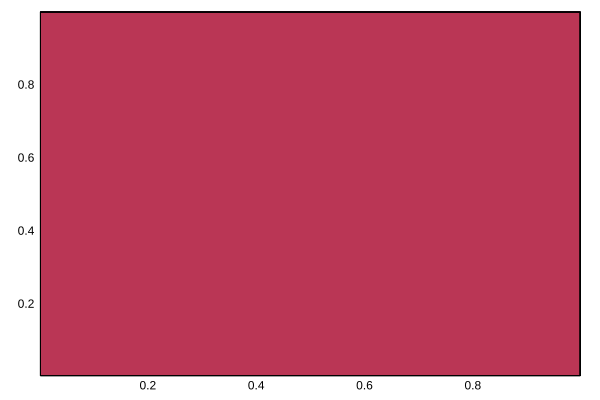

In [45]:
contourf(f[7])

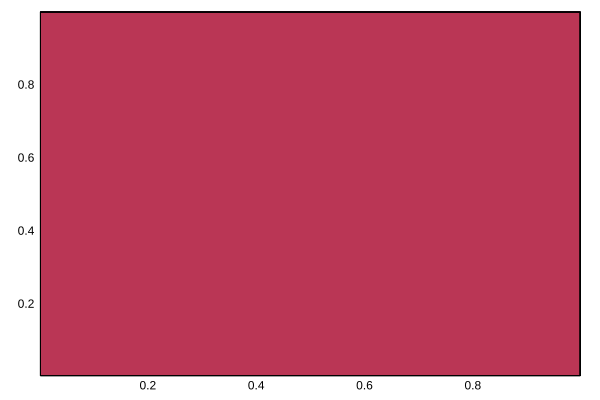

In [46]:
contourf(F[8])

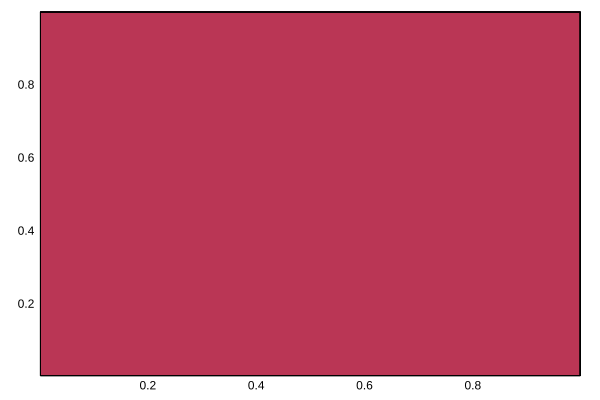

In [47]:
contourf(f[8])

In [48]:
γ0∇=  [∂t   ∂x  0   0   0   0   0   0;
       ∂x   ∂t  0   0   0   0   0   0;
       0    0   ∂t  0   0   0   ∂x  0;
       0    0   0   ∂t  0  -∂x  0   0;
       0    0   0   0   ∂t  0   0   ∂x;
       0    0   0  -∂x  0   ∂t  0   0;
       0    0   ∂x  0   0   0   ∂t  0;
       0    0   0   0   ∂x  0   0   ∂t]

InterlaceOperator : 8-element ArraySpace:
TensorSpace{Tuple{Chebyshev{Interval{:closed,:closed,Int64},Float64},Chebyshev{Interval{:closed,:closed,Int64},Float64}},DomainSets.ProductDomain{Tuple{Interval{:closed,:closed,Int64},Interval{:closed,:closed,Int64}},Tuple{Int64,Int64},StaticArrays.SArray{Tuple{2},Int64,1,2}},Float64}[Chebyshev(0..1)⊗Chebyshev(0..1), Chebyshev(0..1)⊗Chebyshev(0..1), Chebyshev(0..1)⊗Chebyshev(0..1), Chebyshev(0..1)⊗Chebyshev(0..1), Chebyshev(0..1)⊗Chebyshev(0..1), Chebyshev(0..1)⊗Chebyshev(0..1), Chebyshev(0..1)⊗Chebyshev(0..1), Chebyshev(0..1)⊗Chebyshev(0..1)] → 8-element ArraySpace:
TensorSpace{Tuple{Ultraspherical{Int64,Interval{:closed,:closed,Int64},Float64},Ultraspherical{Int64,Interval{:closed,:closed,Int64},Float64}},DomainSets.ProductDomain{Tuple{Interval{:closed,:closed,Int64},Interval{:closed,:closed,Int64}},Tuple{Int64,Int64},StaticArrays.SArray{Tuple{2},Int64,1,2}},Float64}[Ultraspherical(1,0..1)⊗Ultraspherical(1,0..1), Ultraspherical(1,0..1)⊗Ultras

In [49]:
DF=(γ0∇)*F

Fun(8-element ArraySpace:
TensorSpace{Tuple{Ultraspherical{Int64,Interval{:closed,:closed,Int64},Float64},Ultraspherical{Int64,Interval{:closed,:closed,Int64},Float64}},DomainSets.ProductDomain{Tuple{Interval{:closed,:closed,Int64},Interval{:closed,:closed,Int64}},Tuple{Int64,Int64},StaticArrays.SArray{Tuple{2},Int64,1,2}},Float64}[Ultraspherical(1,0..1)⊗Ultraspherical(1,0..1), Ultraspherical(1,0..1)⊗Ultraspherical(1,0..1), Ultraspherical(1,0..1)⊗Ultraspherical(1,0..1), Ultraspherical(1,0..1)⊗Ultraspherical(1,0..1), Ultraspherical(1,0..1)⊗Ultraspherical(1,0..1), Ultraspherical(1,0..1)⊗Ultraspherical(1,0..1), Ultraspherical(1,0..1)⊗Ultraspherical(1,0..1), Ultraspherical(1,0..1)⊗Ultraspherical(1,0..1)],[1.84575, -1.37653, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 2.43025e-8, 1.90831e-8  …  0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0])

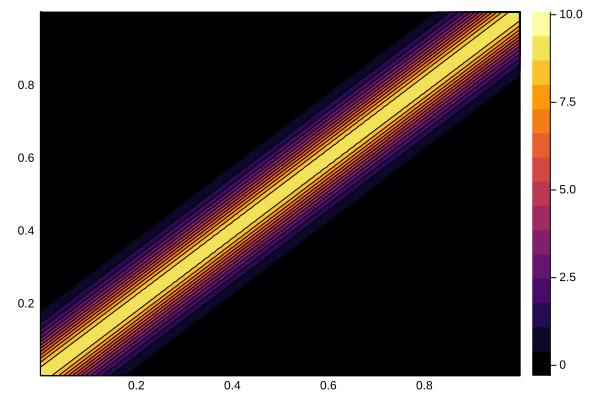

In [50]:
contourf(DF[1])

In [51]:
J1=-DF[2]

Fun(Ultraspherical(1,0..1)⊗Ultraspherical(1,0..1),[1.37653, 0.801345, 1.30993e-8, -1.31946, 1.37173, -0.403205, 0.811949, 3.92494e-8, 3.59226e-8, 1.85128e-8  …  -0.0, -0.0, -0.0, -0.0, -0.0, -0.0, -0.0, -0.0, -0.0, -0.0])

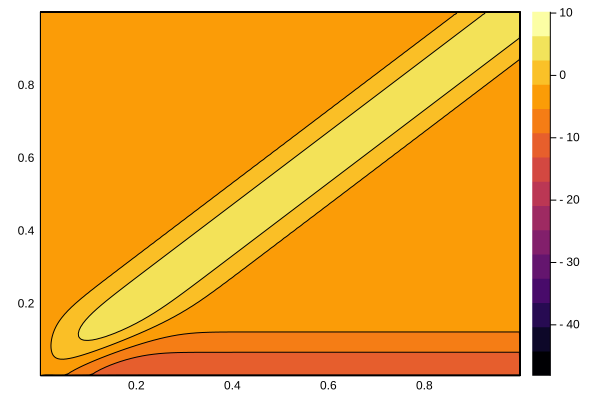

In [52]:
contourf(J1)

In [53]:
diFFF=DF-[ρ;-J1;0;0;0;0;0;0]

Fun(8-element ArraySpace:
TensorSpace{SV,DomainSets.ProductDomain{Tuple{Interval{:closed,:closed,Int64},Interval{:closed,:closed,Int64}},Tuple{Int64,Int64},StaticArrays.SArray{Tuple{2},Int64,1,2}},Float64} where SV[Chebyshev(0..1)⊗Chebyshev(0..1), Ultraspherical(1,0..1)⊗Ultraspherical(1,0..1), Ultraspherical(1,0..1)⊗Ultraspherical(1,0..1), Ultraspherical(1,0..1)⊗Ultraspherical(1,0..1), Ultraspherical(1,0..1)⊗Ultraspherical(1,0..1), Ultraspherical(1,0..1)⊗Ultraspherical(1,0..1), Ultraspherical(1,0..1)⊗Ultraspherical(1,0..1), Ultraspherical(1,0..1)⊗Ultraspherical(1,0..1)],[-0.000387566, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0037091, 0.000913753  …  0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, -0.0])

In [ ]:
l=length(diFFF)
TOT= 0
for i=1:l
    TOT+=diFFF[i]*diFFF[i]
    display(i)
end

In [ ]:
DefiniteIntegral(Chebyshev(0..1)⊗Chebyshev(0..1))*TOT

In [ ]:
difff=(γ0∇)*f

In [ ]:
l=length(difff)
tot= 0
for i=1:l
    tot+=difff[i]*difff[i]
    display(i)
end

In [ ]:
DefiniteIntegral(Chebyshev(0..1)⊗Chebyshev(0..1))*tot